# Počet foci v závislosti na roztoku
### TODO: význam dat

Data jsou mereni na urovni jednotlivych bunek ("Cells.csv"), jednotlivych foci ("Foci.csv") a na urovni jamek ("Cells Stats.csv"). Vyhodnocovat se bude pocet foci na bunku (sloupec "(Foci (Nuclei)) COUNT" v souboru "Cells.csv"), jde o zhodnoceni charakteru techto dat a zpusobu porovnavani dat mezi sebou. Metadata k jamkam jsou v souboru "Cells Stats.csv" - sloupec "Compound" oznacuje typ deplece, non-treated NT, nebo nazev siRNA, sloupec "Dose" je koncentrace dalsiho treatmentu CPT 

https://owncloud.cesnet.cz/index.php/s/UgSV5MbtenDWMf2

Ve screenu se budou porovnavat siRNA pro CPT treatment zvlast. Z-prime bude vyhodnoceny pro negativni kontrolu (napr. siLuc) vuci pozitivni kontrole (napr. siDDX17). 

V mezicase se podivam do literatury a zjistim, jak se pocty foci vyhodnocuji v jinych HCS screenech.




Proc maji poissonovske rozlozeni



## Imports and data loading

In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import plotnine as p9
# p9.options.figure_size = (6,4)
from plotnine import *
p9.theme_set(p9.theme_light) # minimal
import scipy
from scipy import stats
import statsmodels.api as sm
import random
# import pingouin as pg
# import researchpy as rp
import seaborn as sns
import sklearn


from sklearn import linear_model
# !pip install distfit
!pip install distfit

# from distfit import distfit

In [141]:
import numpy as np
import scipy.stats

import matplotlib.pyplot as plt

from scipy.stats import poisson
import matplotlib.pyplot as plt
import numpy as np


## Preprocessing

In [2]:
labels = pd.read_csv('Cell_Stats.csv')
labels.head()

,ID,MeasurementTitle,PlateName,WellID,Row,Column,RowName,ColumnName,WellName,Compound,...,[Cell] (Foci (Nuclei)) TotalIntensity CH2 AVG (AVG),[Cell] (Foci (Nuclei)) TotalIntensity CH2 AVG (SD),[Cell] (Foci (Nuclei)) TotalIntensity CH2 MEDIAN (AVG),[Cell] (Foci (Nuclei)) TotalIntensity CH2 MEDIAN (SD),[Cell] (Foci (Nuclei)) MeanIntensity CH2 AVG (AVG),[Cell] (Foci (Nuclei)) MeanIntensity CH2 AVG (SD),[Cell] (Foci (Nuclei)) MeanIntensity CH2 MEDIAN (AVG),[Cell] (Foci (Nuclei)) MeanIntensity CH2 MEDIAN (SD),[Cell] Focci intensity norm (AVG),[Cell] Focci intensity norm (SD)
0,1,Aurora 384_jd foci siRNA SP TP-JD035_20230209_...,TP-JD035,128,6,8,F,8,F-08,NT,...,27071.56,6465.51,20600.66,6340.89,1297.7066,218.6880,1145.1269,217.5890,111.264679,53.644325
1,57,Aurora 384_jd foci siRNA SP TP-JD035_20230209_...,TP-JD035,129,6,9,F,9,F-09,siCON1,...,28823.60,7517.91,22415.63,7871.88,1332.1009,240.6524,1194.7287,252.2252,143.537641,86.033061
2,19,Aurora 384_jd foci siRNA SP TP-JD035_20230209_...,TP-JD035,130,6,10,F,10,F-10,siCON2,...,30752.28,9439.02,24581.50,9486.04,1374.9472,293.4447,1253.3712,298.9371,142.481245,91.257556
3,41,Aurora 384_jd foci siRNA SP TP-JD035_20230209_...,TP-JD035,131,6,11,F,11,F-11,siLuc,...,33115.41,10845.64,27221.47,11869.52,1449.6688,309.8516,1346.2094,350.9527,154.251397,83.046946
4,6,Aurora 384_jd foci siRNA SP TP-JD035_20230209_...,TP-JD035,132,6,12,F,12,F-12,siPLK1,...,8510.35,9870.18,7564.84,8909.15,496.9593,452.1947,473.6609,426.6811,85.026263,125.576196


In [3]:
labels = pd.read_csv('Cell_Stats.csv')[['WellID', 'Compound', 'Dose']]
labels.head()

,WellID,Compound,Dose
0,128,NT,0
1,129,siCON1,0
2,130,siCON2,0
3,131,siLuc,0
4,132,siPLK1,0


In [4]:
labels['Compound'].value_counts()

Compound
NT         12
siCON1      6
siCON2      6
siLuc       6
siPLK1      6
siDDX17     6
siSETX      6
siMSH3      6
siTHOC1     6
Name: count, dtype: int64

Vypsali jsme si počty jamek obsahujících všechny sloučeniny. Máme 9 sloučenin a každou až na kontrolu obsahuje 6 jamek. 3 z toho jsou pak s "Dose"=100 (koncentrace dalsiho treatmentu CPT)

In [5]:
cols = ['WellID', 'AreaIndex', '(Foci (Nuclei)) COUNT'
        # '(Nuclei) MinX', '(Nuclei) MaxX', '(Nuclei) MinY', '(Nuclei) MaxY',
        # '(Nuclei) X-CoordinateInWell', '(Nuclei) Y-CoordinateInWell',
]
cells = pd.read_csv('Cell.csv')[cols]
cells

df = cells.merge(labels).rename({'(Foci (Nuclei)) COUNT':'Count', 'WellID':'Well'}, axis=1)
df

,Well,AreaIndex,Count,Compound,Dose
0,128,1,2,NT,0
1,128,1,5,NT,0
2,128,1,40,NT,0
3,128,1,55,NT,0
4,128,1,29,NT,0
...,...,...,...,...,...
137638,257,100,106,NT,100
137639,257,100,70,NT,100
137640,257,100,282,NT,100
137641,257,100,58,NT,100


Bude nás zajímat víceméně pouze tabulka Cell.csv, kde máme data nejpodrobnější a kde můžeme snadno zjistit, kolik foci obsahují jednotlivé buňky v každé jamce.

TODO: jamka může obsahovat méně buněk, které ale průměrně budou mít vyšši počet foci. je to problém?

převedeme jamky a sloučeniny na kategoriální proměnné

In [6]:
df["Well"] = df["Well"].astype('category')
df["Compound"] = df["Compound"].astype('category')

df

,Well,AreaIndex,Count,Compound,Dose
0,128,1,2,NT,0
1,128,1,5,NT,0
2,128,1,40,NT,0
3,128,1,55,NT,0
4,128,1,29,NT,0
...,...,...,...,...,...
137638,257,100,106,NT,100
137639,257,100,70,NT,100
137640,257,100,282,NT,100
137641,257,100,58,NT,100


## Analýza dat

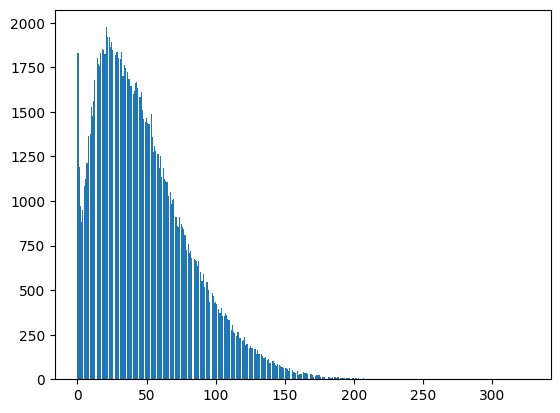

In [7]:
plt.hist(df['Count'], 400);

počty buněk s daným množstvím foci - napříč všemi sloučeninami

C:\Users\lordo\AppData\Local\Programs\Python\Python310\lib\site-packages\plotnine\stats\stat_bin.py:109: PlotnineWarning: 'stat_bin()' using 'bins = 188'. Pick better value with 'binwidth'.


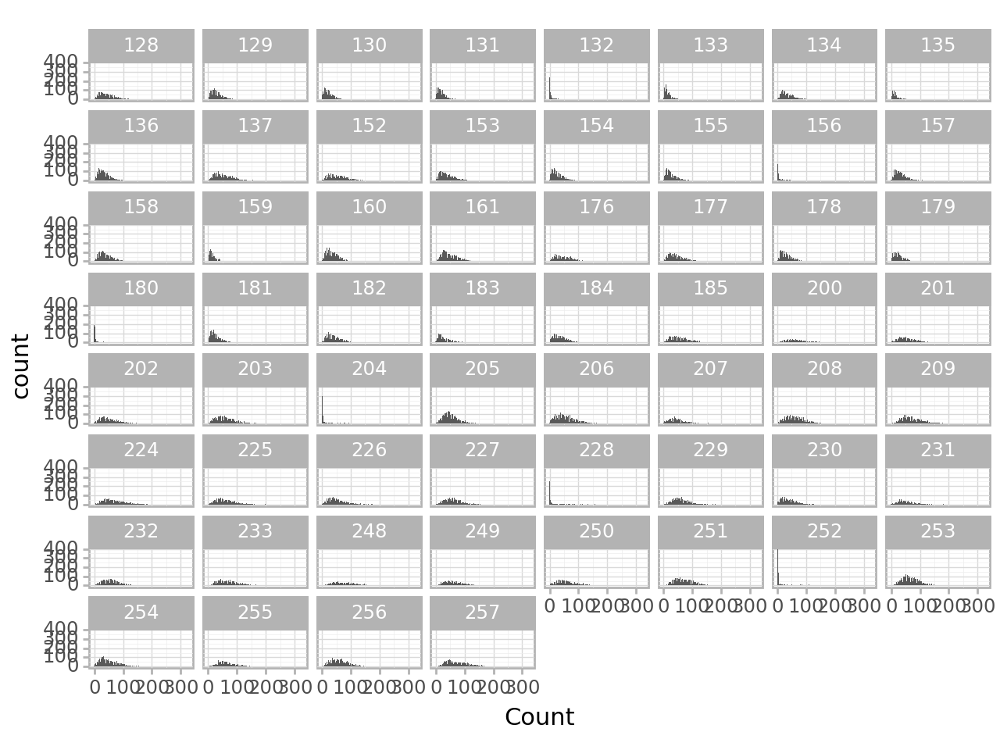

<Figure Size: (640 x 480)>

In [8]:
(ggplot(df)
 + aes(x = 'Count')
 + geom_histogram()
 + facet_wrap('Well') # rozdeli podle jamicek na grafy
)

Takto vypadají počty foci v buňkách pro jednotlivé jamky.
Otázkou nyní je, jestli by se dala spojit dohromady data z jamek, které obsahují stejnou sloučeninu.

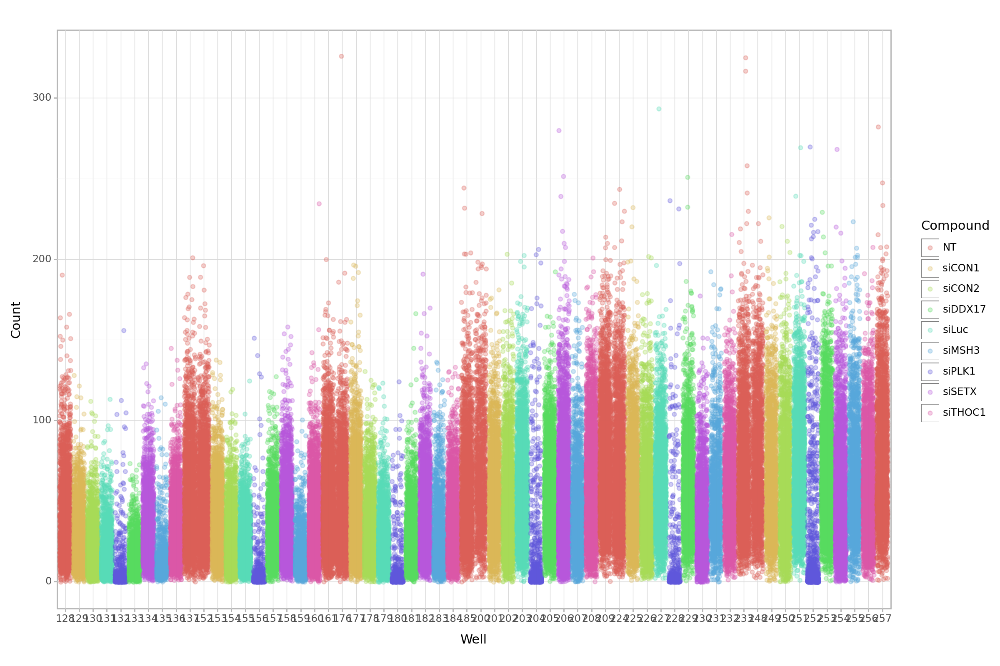

<Figure Size: (1200 x 800)>

In [9]:
(ggplot(df)
 + aes(x="Well", y='Count', color='Compound')
 + geom_jitter(alpha=.3) # jitter = position of the point
 + theme(figure_size=(12,8))
)

Tady je vizuálně pěknější graf, kde jde dobře vidět, jak se liší počty foci v buňkách pro různé sloučeniny a jak se naopak podobají pro stejné (v rámci stejné Dose)
Ukážeme si tedy graficky, jak moc jsou si podobná data z jamek se stejnými sloučeninami i dose. První půlka má dose 0 a druhá má dose 100.

Vyfiltrujeme si tedy nejdříve data pro Dose = 0.

In [10]:
dose_0 = df.query('Dose==0')
dose_0

,Well,AreaIndex,Count,Compound,Dose
0,128,1,2,NT,0
1,128,1,5,NT,0
2,128,1,40,NT,0
3,128,1,55,NT,0
4,128,1,29,NT,0
...,...,...,...,...,...
64290,185,100,31,NT,0
64291,185,100,25,NT,0
64292,185,100,30,NT,0
64293,185,100,28,NT,0


In [11]:
nt = dose_0.query("Compound=='NT'")

In [12]:
nt

,Well,AreaIndex,Count,Compound,Dose
0,128,1,2,NT,0
1,128,1,5,NT,0
2,128,1,40,NT,0
3,128,1,55,NT,0
4,128,1,29,NT,0
...,...,...,...,...,...
64290,185,100,31,NT,0
64291,185,100,25,NT,0
64292,185,100,30,NT,0
64293,185,100,28,NT,0


In [13]:
well_128 = df.query('Well==128')

In [14]:
# rozdělíme podle jednotlivých compounds

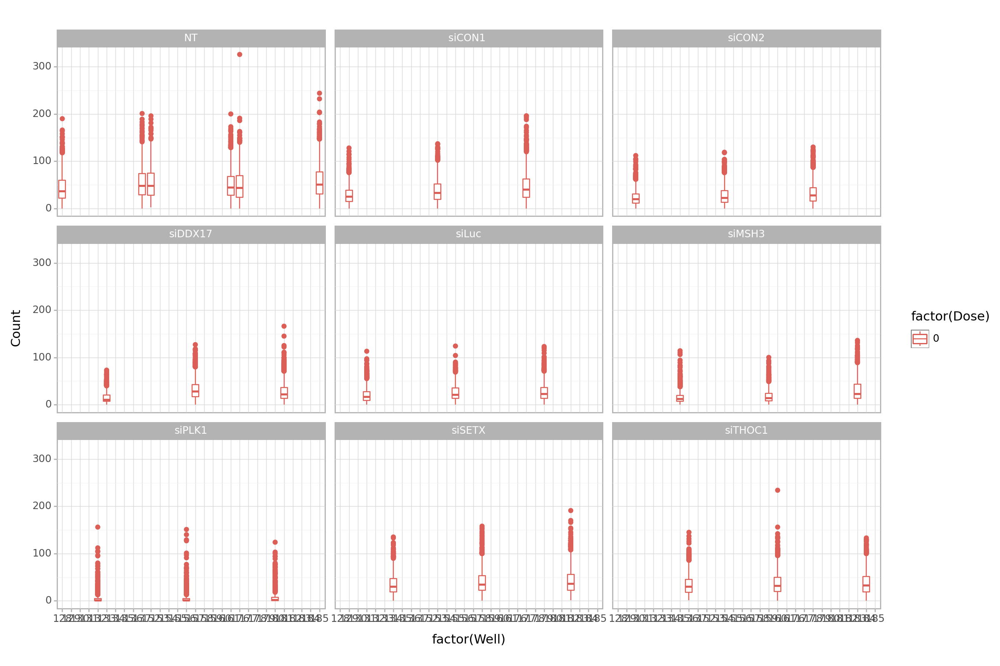

<Figure Size: (1200 x 800)>

In [15]:
(
    ggplot(dose_0, aes(x='factor(Well)', y='Count',  color='factor(Dose)'))
    #+ geom_point()
    #+ geom_jitter(alpha=.3)
    + geom_boxplot()
    + facet_wrap('Compound')
    + labs(x='factor(Well)', y='Count')
    + theme(figure_size=(12,8))
)

Podíváme se nyní blíže na naměřená data z jamek obsahujících kontrolu

























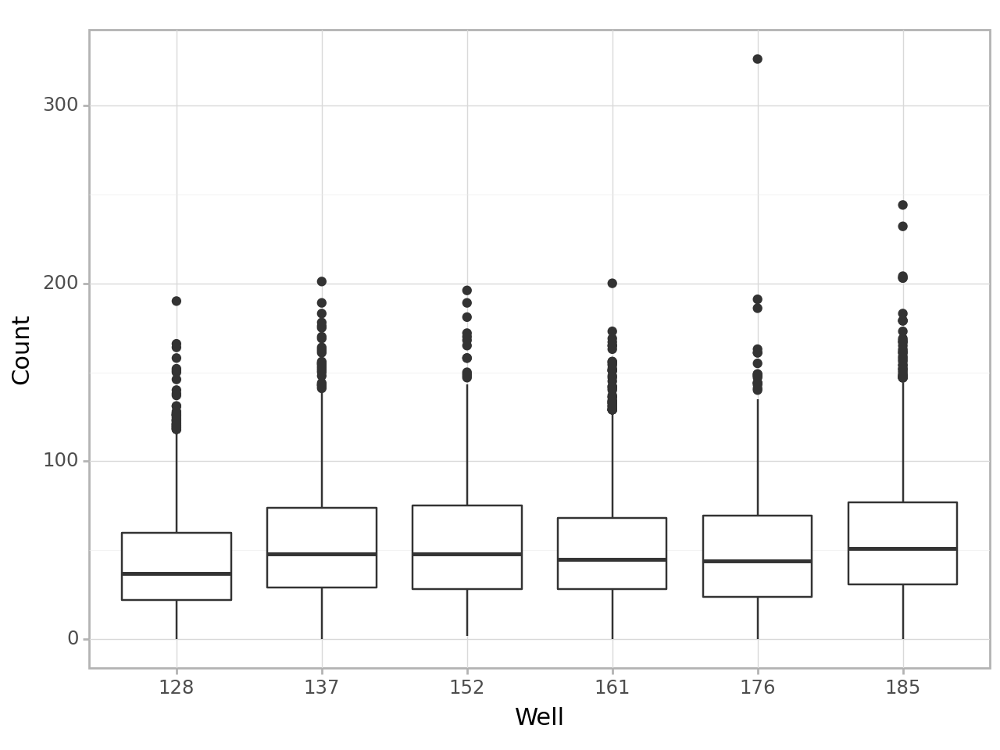

<Figure Size: (640 x 480)>

In [16]:
(ggplot(nt)
 + aes(x = 'Well', y='Count')
 + geom_boxplot()
)

Vypadá to, že by data mohla mít stejnou distribuci. 
Chceme si to ale ověřit. Ověříme si to pomocí KS testu.

Takto probíhá procedura KS testu:

<div>
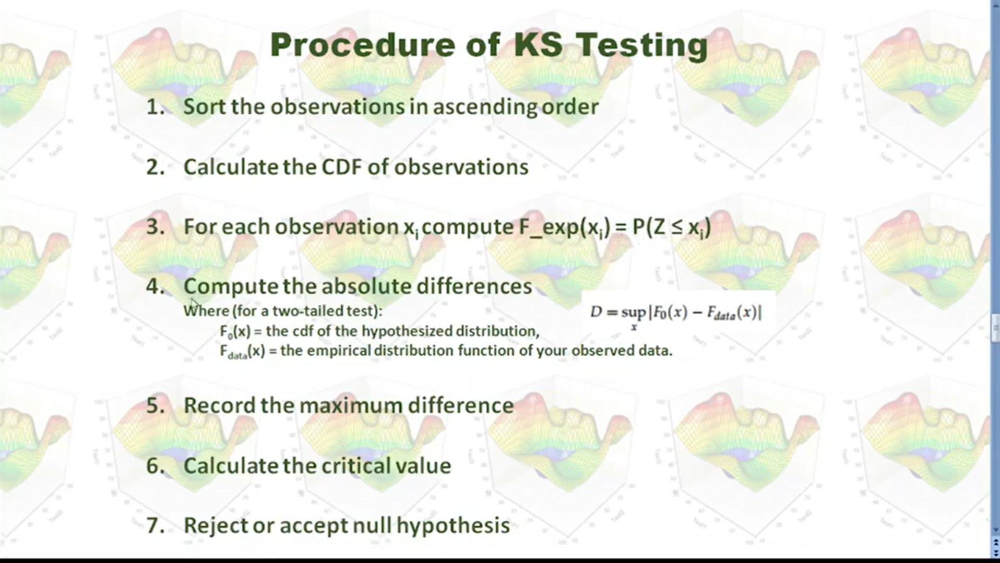
</div>

<div>
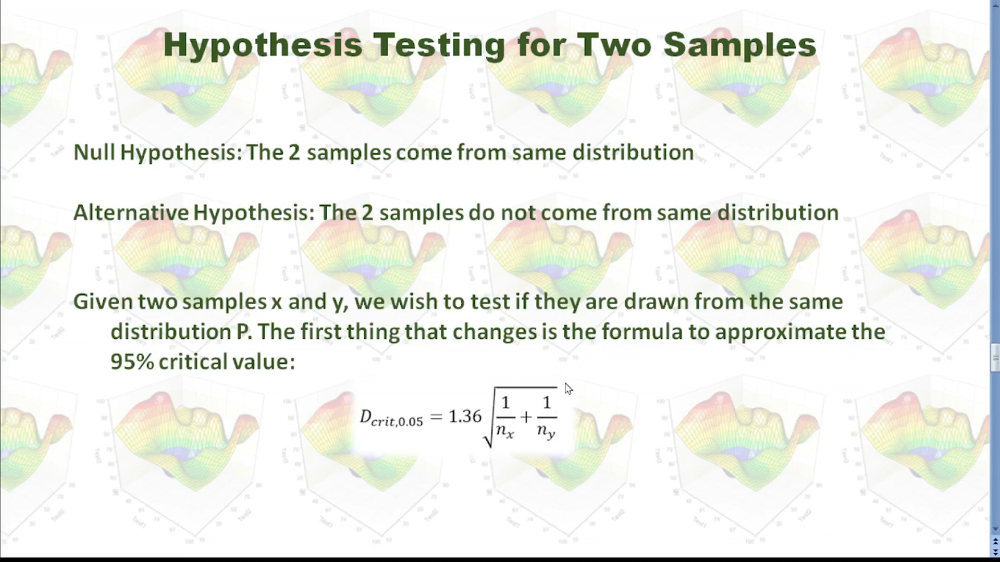
</div>

Začneme tak, že se zaměříme na první z jamek obsahujících kontrolu. Pro tuto jamku najdeme co nejlepší předpis její empirické distribuce. 
Následně provedeme KS test, abychom zjistili, jestli tato distribuce naše data vystihuje dostatečně dobře.
Pokud ano, pak zkontrolujeme, jestli i ostatní jamky obsahující kontrolu mají stejnou distribuci.

TODO porovnat jamky mezi sebou KS testem

Není možné jen tak porovnat empirickou distribuci 
s její teoretickou distribucí. Jelikož to, jak moc se 
na grafu podobají, je přímo ovlivněné hustotou histogramu a 
byla by alchimie se to snažit na sebe napasovat. Ukázka:

In [98]:
def fit_poisson(data=None, mu=None, bins_=30):
    sns.set_theme()
    fig, ax = plt.subplots(1, 1)

    x = np.arange(poisson.ppf(0.01, mu),
                  poisson.ppf(0.99, mu))
    
    sns.histplot(data, stat='probability', bins=bins_)
    
    plt.plot(x, poisson.pmf(x, mu))

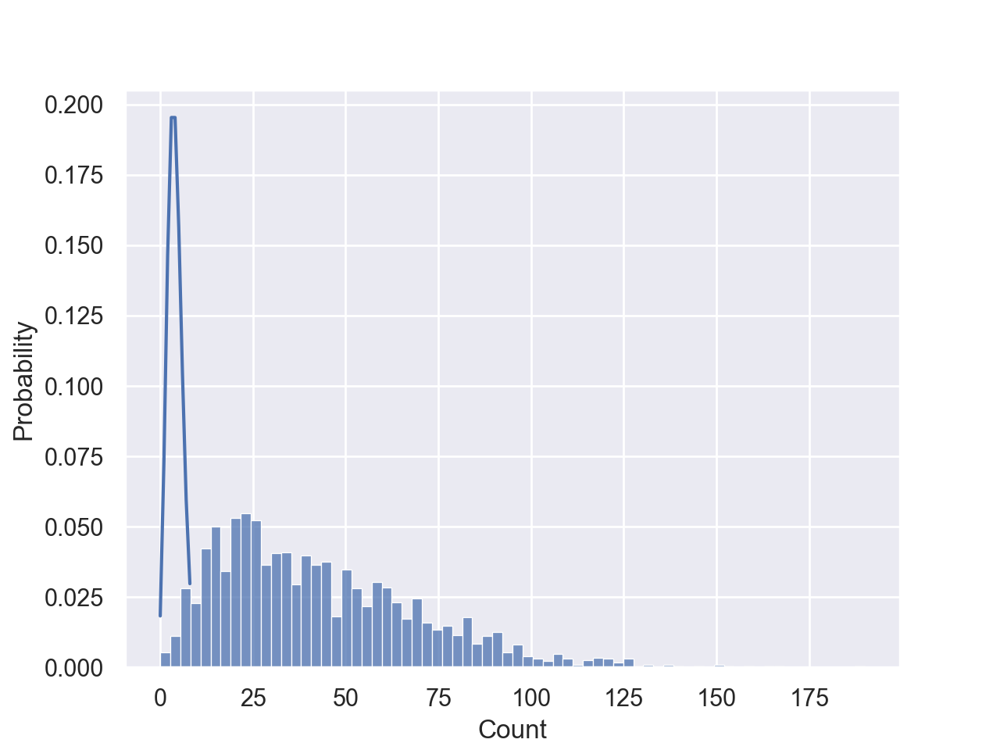

In [99]:
data_ = well_128['Count']
fit_poisson(data, mu=4, bins_=70)

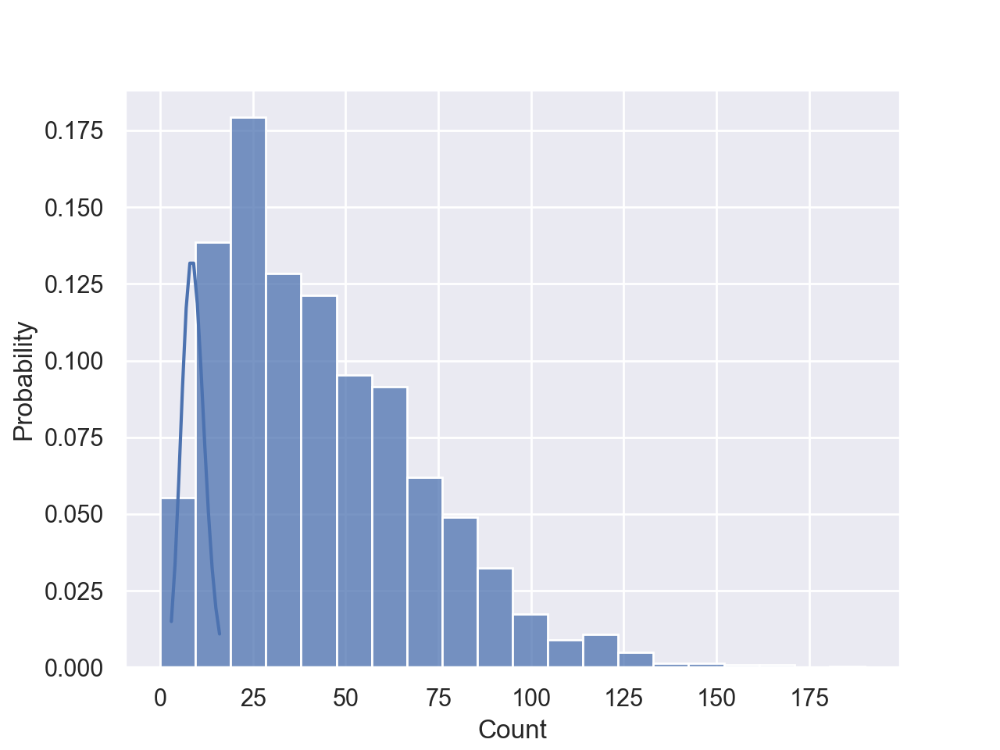

In [100]:
fit_poisson(data_, mu=9, bins_=20)

Proto na sebe budeme fitovat distribuční funkce.

# Poisson regression using Stochastic gradient descent and Maximum likelihood estimation

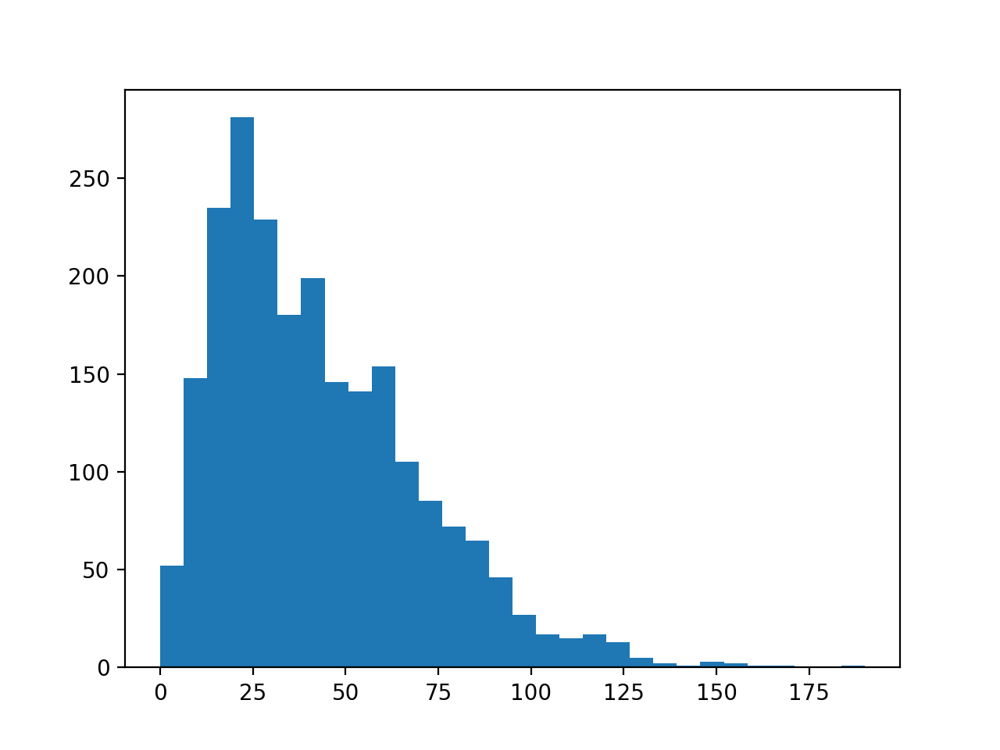

In [17]:
plt.hist(well_128['Count'], bins=30);

# fits the distribution but i cant gen the parameters from it:

In [36]:
# !pip install distfit
# from distfit import distfit


# # Lets suppose that X is our data.
# X = well_128['Count']

# # Initialize with default settings
# model= distfit(bound='both')

# # Fit to find the best theoretical distribution 
# model.fit_transform(X)

# model.plot(
#           pdf_properties={'color': 'r', 'linewidth': 4},
#           bar_properties={'color': '#1e3f5a', 'edgecolor': 'k'})

# Absolute shit

In [33]:
import argparse
import numpy as np
import sklearn.datasets
import sklearn.metrics
import sklearn.model_selection
import math
import matplotlib
import matplotlib.pyplot as plt
import random.poisson

ModuleNotFoundError: No module named 'random.poisson'; 'random' is not a package

In [91]:
# plot = True
# batch_size = 10
# learning_rate = 0.01
# epochs = 50
# size = 1000
    
# data = well_128['Count']
# X_train = [i for i in range(len(data))]
# y_train = data.to_numpy()

# lambda_ = 0.01

# def sigmoid(x):
#     return 1 / (1 + np.exp(-x))

# # for ii in range(len(X_train)):
# # max 92

# for ii in range(92):
#     dato = ii
#     target = y_train[ii]
#     gradient = (sigmoid(dato * lambda_) - target) * dato
#     gradient /= 1
#     lambda_ = lambda_ - learning_rate * gradient

# # TODO: After the SGD epoch, measure the average loss and accuracy for both the
# # train set and the test set. The loss is the average MLE loss (i.e., the
# # negative log likelihood, or crossentropy loss, or KL loss) per example.

#     y_pred_train = sigmoid(((lambda_**(ii))*((math.e)**(-lambda_)))/math.factorial(ii))
#     train_loss = (y_train - y_pred_train)**2
#     train_accuracy = y_train - y_pred_train


#     print("After epoch", (ii +1), ": train loss", train_loss, "lambda", lambda_)

# if plot:
#     plt.hist(well_128['Count'], bins=30);
# #         plt.plot(t**3,t, color='green',label='cubes')
# #         plt.title("Poissonovská regrese")
# #         plt.legend()
# #         plt.show()
# #         # sns.kdeplot(np.random.poisson(5, size))
# #         # sns.distplot(np.random.poisson(lam=50, size=1000), hist=False, label='poisson')


In [90]:
# plt.hist(well_128['Count'], bins=200)


# DOESNT WORK

In [24]:
# clf = linear_model.PoissonRegressor()
# data = well_128['Count']
# X_ = pd.DataFrame([[i] for i in range(len(data))])
# y = data.to_numpy()
# # X.reshape(-1, 1)
# clf.fit(X, y)

# WHO KNOWS WTF

In [ ]:
if(step==1):
    fig, ax = plt.subplots()
    arr_1_more = np.random.normal(mu, sigma, size=6000)
    arr_1_sorted = np.sort(arr_1_more)
    y_cdf = st.norm.cdf(arr_1_sorted, mu, sigma) # the normal cdf
    y_cdf = st.norm.cdf(arr_1_sorted, mu, sigma) # the normal cdf
    norm_data=st.norm.pdf(arr_1_sorted, mu, sigma)
    poisson_pmf = st.poisson.pmf(mu, arr_1_sorted)
    ax.plot(arr_1_sorted, norm_data, label="Normal")
    ax.plot(arr_1_sorted, poisson_pmf, label="Poisson")
    ax.set_xlabel("x", size=12)
    ax.set_ylabel("F(x)", size=12)
    legend = ax.legend(loc="upper left")
    plt.show()
#generate random aray
if(step>1):
   pass

# Actual

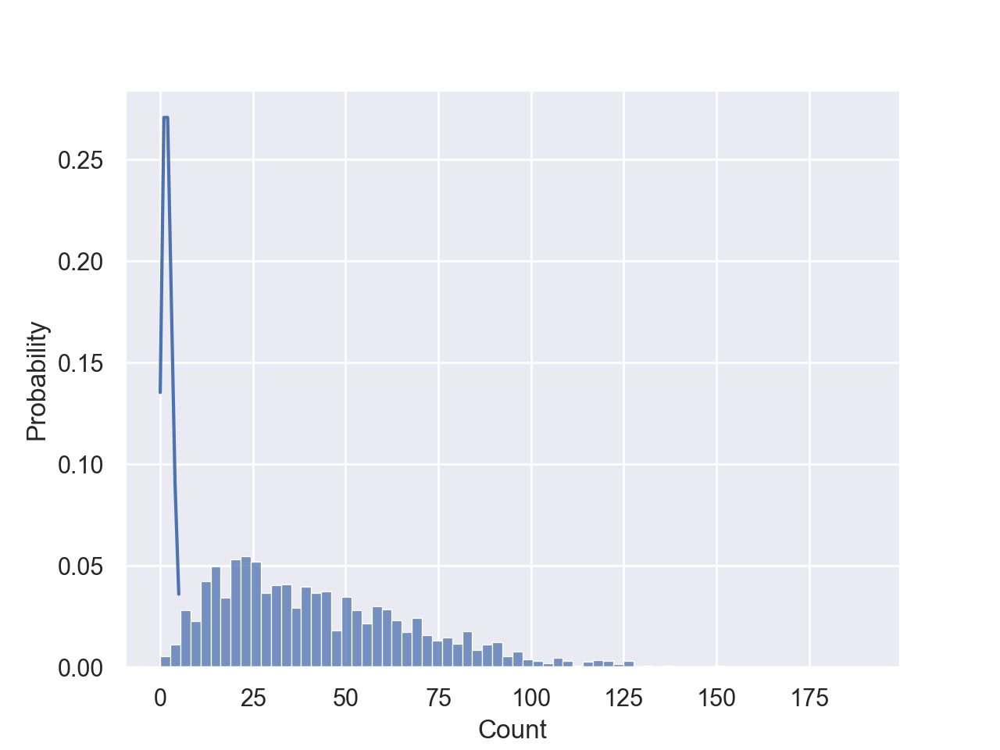

In [89]:
data = well_128['Count']
fit_poisson(data, mu=2)

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16]


In [ ]:
import numpy as np
import scipy.stats as st
import matplotlib.pyplot as plt
from numpy.random import seed

In [105]:
mu = 5
sigma = 1
seed(0)
step=2

In [161]:
data = well_128['Count']
data_ = [i for i in data_]
mysize = len(data_)
ll = [i for i in range(mysize)]

In [122]:
poisson_cdf = 1-st.poisson.cdf(mu, arr_1_sorted)

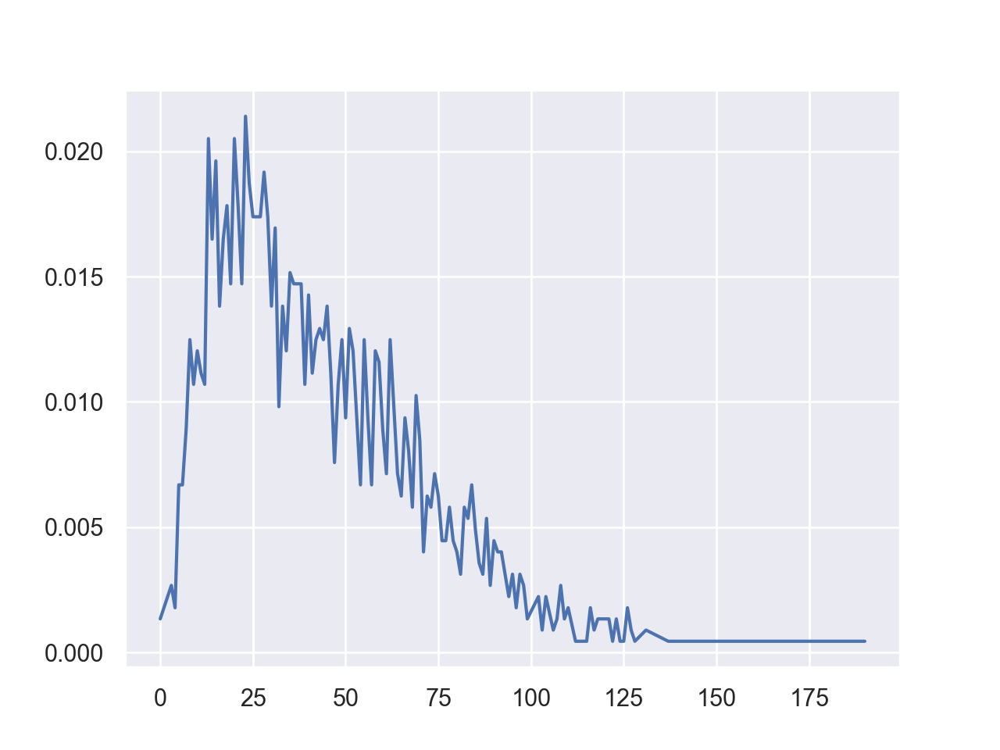

In [181]:
k = list(set(data_))
pmf = [data_.count(i)/len(data_) for i in k] #Probability mass function
   
plt.plot(k, pmf) 
plt.show()

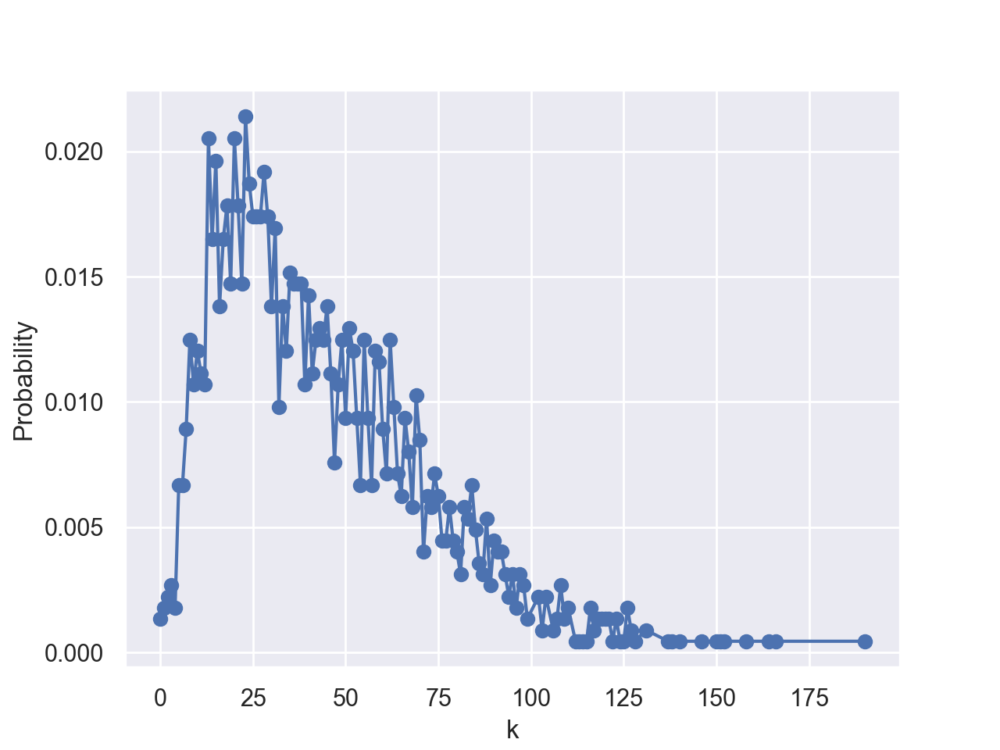

In [182]:
plt.plot(k, pmf, marker='o')
plt.xlabel('k')
plt.ylabel('Probability')

plt.show()

# Poisson CDF (cumulative distribution function) in Python


In [187]:
cdf = []
sum_ = 0
for i in pmf:
    sum_ += i
    cdf.append(sum_)
#     mohli bychom pouzit take log cdf, abychom data "vyrovnali"

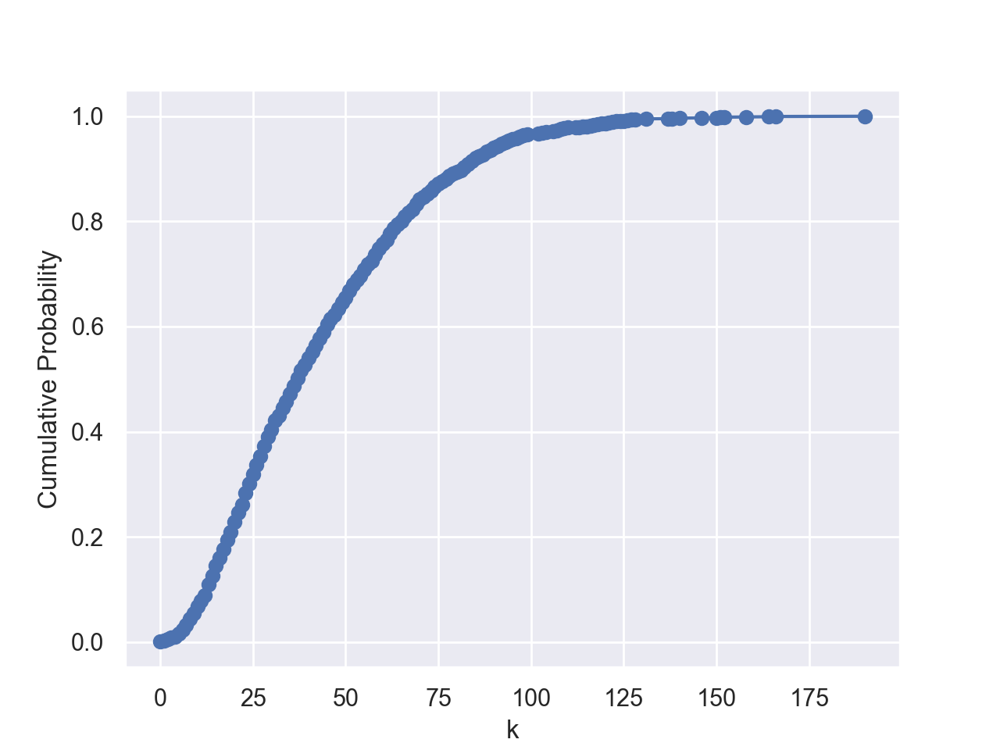

In [188]:
plt.plot(k, cdf, marker='o')
plt.xlabel('k')
plt.ylabel('Cumulative Probability')

plt.show()

Získali jsme nyní distribuční funkci pro hustotní funkci počtu buněk pro různé počty foci.  

Nyní si zkusíme udělat distribuční funkci z teoretické poissonovské distribuce 
(nikoli empirické).
To nebude asi snadné, nenašla jsem na to žádné knihovny.

# Distribuční funkce k poissonovskému rozdělení

ValueError: x and y must have same first dimension, but have shapes (7,) and (1,)

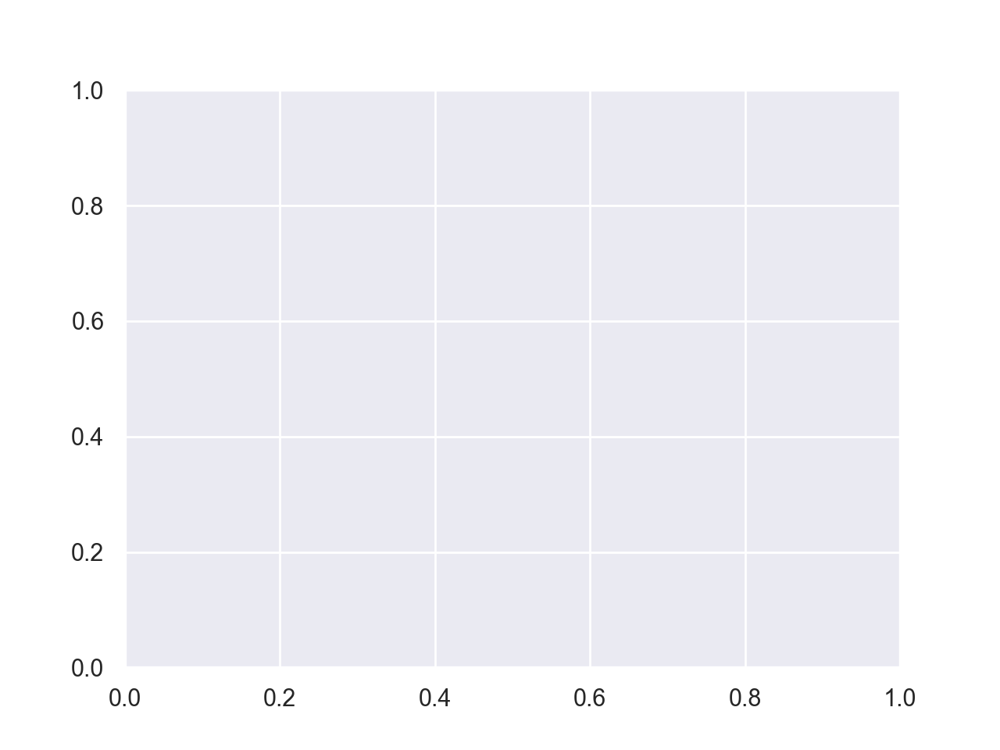

In [201]:
# importing the required modules
import matplotlib.pyplot as plt
import numpy as np

# setting the x - coordinates
x = np.arange(0, 2*(np.pi))
# setting the corresponding y - coordinates
l = 1
y = (np.e**(-l))*(np.sum([0.5, 1.5]))

# plotting the points
plt.plot(x, y)

# function to show the plot
plt.show()


In [200]:
y = (np.e**(-l))*(np.sum([0.5, 1.5]))
y

0.7357588823428847

In [202]:
y

0.7357588823428847

In [189]:

#calculate absolute difference
arr_dif_abs = np.abs(y_cdf-data)
print("Difference relative to normal distribution")
print(arr_dif_abs)

#get max difference
dn_ks = max(arr_dif_abs)
print("Maximum difference relative to normal distribution:{}".format(dn_ks))
#calculate absolute difference for poisson distribution
arr_dif_abs_poisson = np.abs(y_cdf-poisson_cdf)
print("Difference relative to poisson distribution")
print(arr_dif_abs_poisson)
ps_ks = max(arr_dif_abs_poisson)
print("Maximum difference relative to normal distribution:{}".format(dn_ks))
print("Maximum difference relative to poisson distribution:{}".format(ps_ks))
D_critial=1.36 * np.sqrt(2/mysize)
print("Critical value at 95% confidence interval:{}".format(D_critial))

Difference relative to normal distribution
0        1.576810
1        4.083918
2       39.000000
3       54.000000
4       28.000000
          ...    
2238    25.000000
2239    19.000000
2240    83.000000
2241    27.000000
2242    15.000000
Name: Count, Length: 2243, dtype: float64
Maximum difference relative to normal distribution:189.0


ValueError: operands could not be broadcast together with shapes (2243,) (100,) 

# just plotting poisson

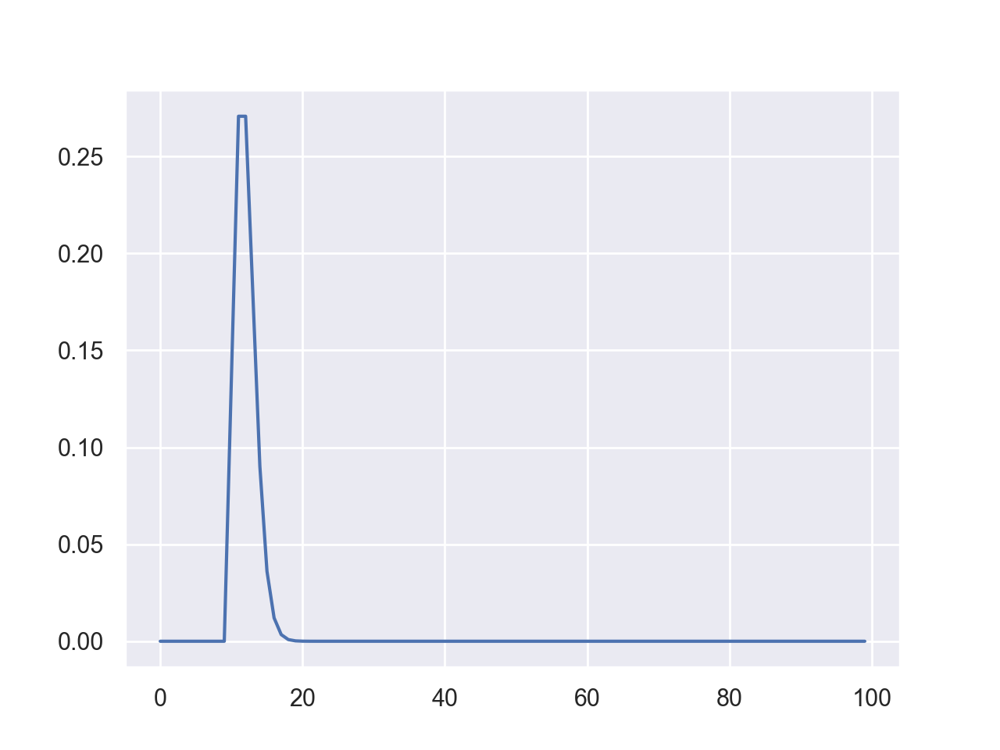

In [101]:
# importing poisson from scipy
from scipy.stats import poisson
 
# importing numpy as np
import numpy as np
 
# importing matplotlib as plt
import matplotlib.pyplot as plt
 
 
# creating a numpy array for x-axis
# using step size as 1
x = np.arange(0, 100, 1)
 
# poisson distribution data for y-axis
y = poisson.pmf(x, mu=2, loc=10)
 
 
# plotting the graph
plt.plot(x, y)
 
# showing the graph
plt.show()

# idk

Scukneme vždy 3 jamky se stejnou compound a 0 nebo 100

In [ ]:
df_deep_copy = df.copy()
df_deep_copy

In [ ]:
dict = {}
for row in df_deep_copy.iterrows():
    print(row)
    key = row['Compound']
    if key in dict.keys():
        dict[key] = dict[key].append((row['Count'], row['Dose']))
    else:
        dict[key] = []

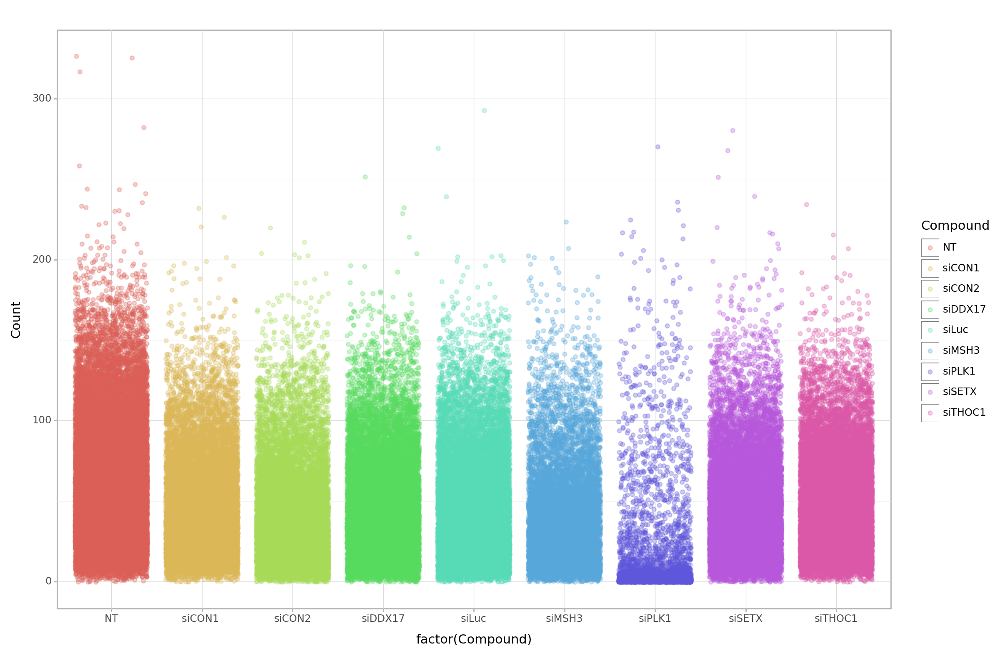

<Figure Size: (1200 x 800)>

In [44]:
(ggplot(df)
 + aes(x="factor(Compound)", y='Count', color='Compound')
 + geom_jitter(alpha=.3)
 + theme(figure_size=(12,8))
)

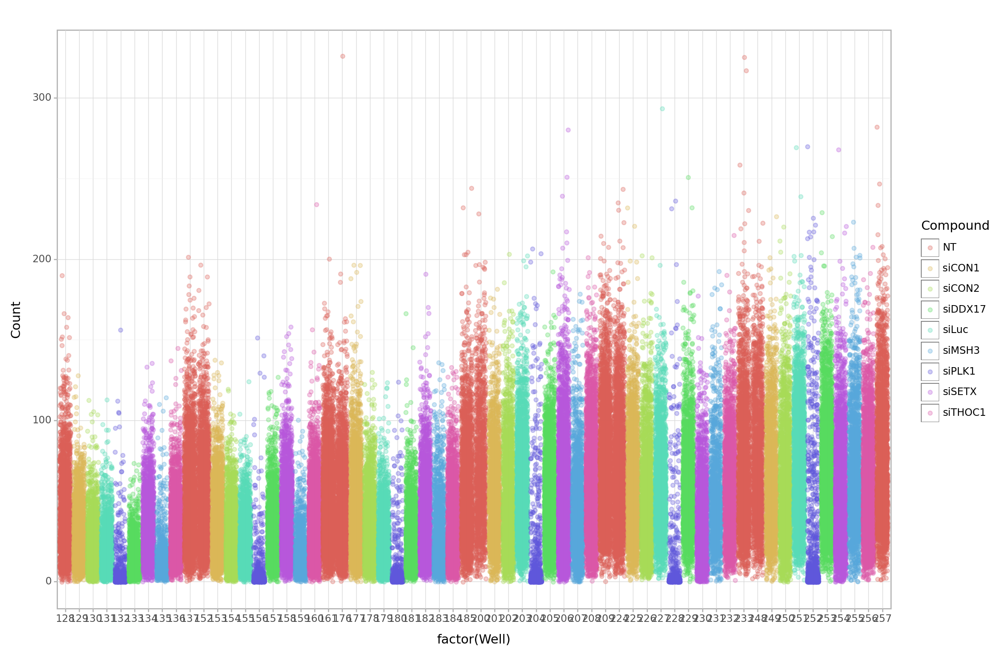

<Figure Size: (1200 x 800)>

In [45]:
(ggplot(df)
 + aes(x='factor(Well)', y='Count', color='Compound')
 + geom_jitter(alpha=.3)
 + theme(figure_size=(12,8))
)

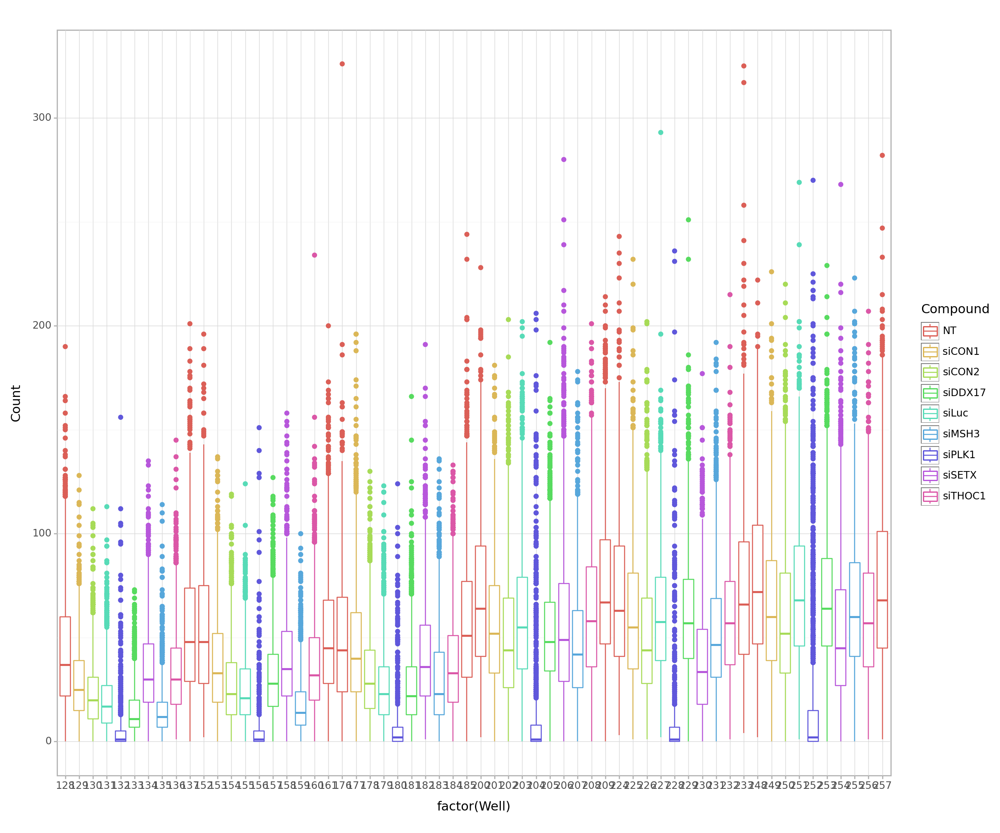

<Figure Size: (1200 x 1000)>

In [46]:
(ggplot(df)
 + aes(x='factor(Well)', y='Count', color='Compound')
 + geom_boxplot()
 + theme(figure_size=(12,10))
)

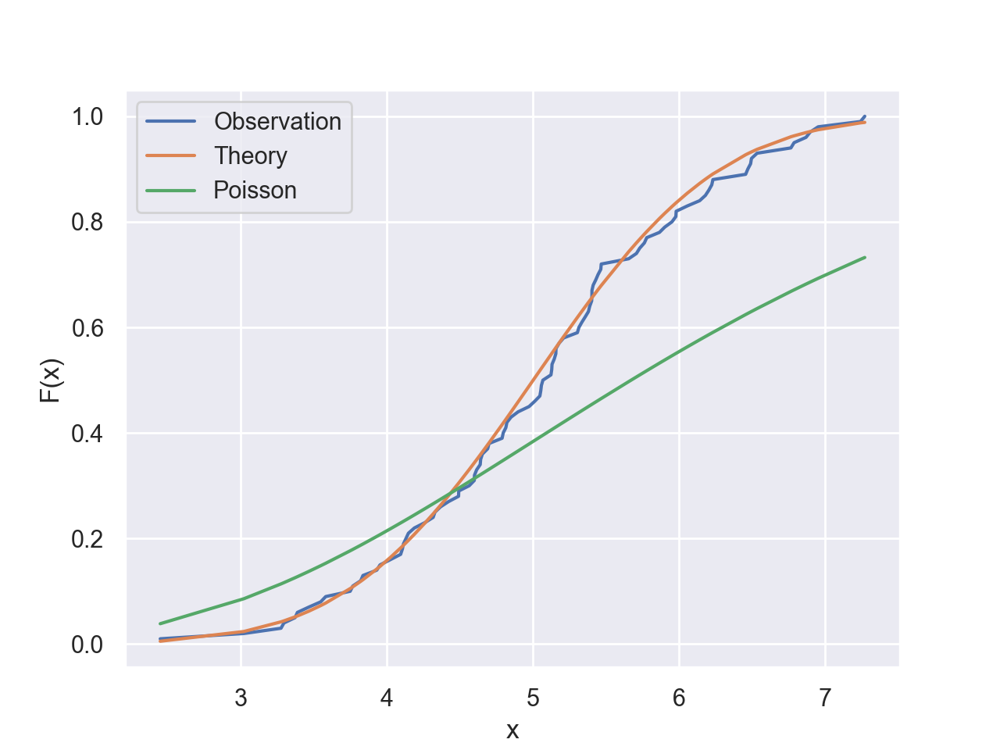

Difference relative to normal distribution
[0.00465987 0.00380705 0.01214829 0.00397889 0.00152979 0.00672521
 0.00776069 0.00707752 0.01219877 0.0051401  0.00155233 0.00112556
 0.00802083 0.00214034 0.00280804 0.0042158  0.01212452 0.00526887
 0.00267199 0.00806754 0.01347403 0.0119329  0.00100632 0.00673188
 0.00064531 0.00293532 0.01134531 0.02474376 0.01514758 0.03066621
 0.03340903 0.02392263 0.01925714 0.01839912 0.00959066 0.00395308
 0.00769031 0.00121064 0.02576477 0.01872424 0.01575824 0.00860579
 0.00984697 0.01889464 0.03875841 0.04418883 0.04824864 0.0407139
 0.03239495 0.02651698 0.0384218  0.03049501 0.02131441 0.01726697
 0.01156862 0.00212102 0.00041316 0.00249287 0.02885382 0.02288539
 0.02068734 0.0192169  0.01734507 0.0105858  0.00547963 0.00384593
 0.01371631 0.02068348 0.02420476 0.02857073 0.03176023 0.04072857
 0.01332122 0.02008412 0.01702687 0.01668273 0.01156524 0.02632584
 0.02615971 0.02896634 0.02562606 0.01614527 0.02416192 0.03273196
 0.03075702 0.025391

In [47]:
import numpy as np
import scipy.stats as st
import matplotlib.pyplot as plt
from numpy.random import seed
mu = 5
sigma = 1
seed(0)
step=2
if(step==1):
    fig, ax = plt.subplots()
    arr_1_more = np.random.normal(mu, sigma, size=6000)
    arr_1_sorted = np.sort(arr_1_more)
    y_cdf = st.norm.cdf(arr_1_sorted, mu, sigma) # the normal cdf
    y_cdf = st.norm.cdf(arr_1_sorted, mu, sigma) # the normal cdf
    norm_data=st.norm.pdf(arr_1_sorted, mu, sigma)
    poisson_pmf = st.poisson.pmf(mu, arr_1_sorted)
    ax.plot(arr_1_sorted, norm_data, label="Normal")
    ax.plot(arr_1_sorted, poisson_pmf, label="Poisson")
    ax.set_xlabel("x", size=12)
    ax.set_ylabel("F(x)", size=12)
    legend = ax.legend(loc="upper left")
    plt.show()
#generate random aray
if(step>1):
    mysize=100
    arr_1_few = np.random.normal(mu, sigma, size=mysize)
    #sort generated array
    arr_1_sorted = np.sort(arr_1_few)
    #edf
    arr_1_edf_few = np.arange(1, len(arr_1_few)+1) / len(arr_1_few)
    #generate dataset that follow a Poisson distribution with mean=mu
    poisson_cdf = 1-st.poisson.cdf(mu, arr_1_sorted)
    fig, ax = plt.subplots()
    ax.plot(arr_1_sorted, arr_1_edf_few, label="Observation")
    y_cdf = st.norm.cdf(arr_1_sorted, mu, sigma) # the normal cdf
    norm_data=st.norm.pdf(arr_1_sorted, mu, sigma)
    ax.plot(arr_1_sorted, y_cdf, label="Theory")
    ax.plot(arr_1_sorted, poisson_cdf, label="Poisson")
    ax.set_xlabel("x", size=12)
    ax.set_ylabel("F(x)", size=12)
    legend = ax.legend(loc="upper left")
    plt.show()
    #calculate absolute difference
    arr_dif_abs = np.abs(y_cdf-arr_1_edf_few)
    print("Difference relative to normal distribution")
    print(arr_dif_abs)
    #get max difference
    dn_ks = max(arr_dif_abs)
    print("Maximum difference relative to normal distribution:{}".format(dn_ks))
    #calculate absolute difference for poisson distribution
    arr_dif_abs_poisson = np.abs(y_cdf-poisson_cdf)
    print("Difference relative to poisson distribution")
    print(arr_dif_abs_poisson)
    ps_ks = max(arr_dif_abs_poisson)
    print("Maximum difference relative to normal distribution:{}".format(dn_ks))
    print("Maximum difference relative to poisson distribution:{}".format(ps_ks))
    D_critial=1.36 * np.sqrt(2/mysize)
    print("Critical value at 95% confidence interval:{}".format(D_critial))

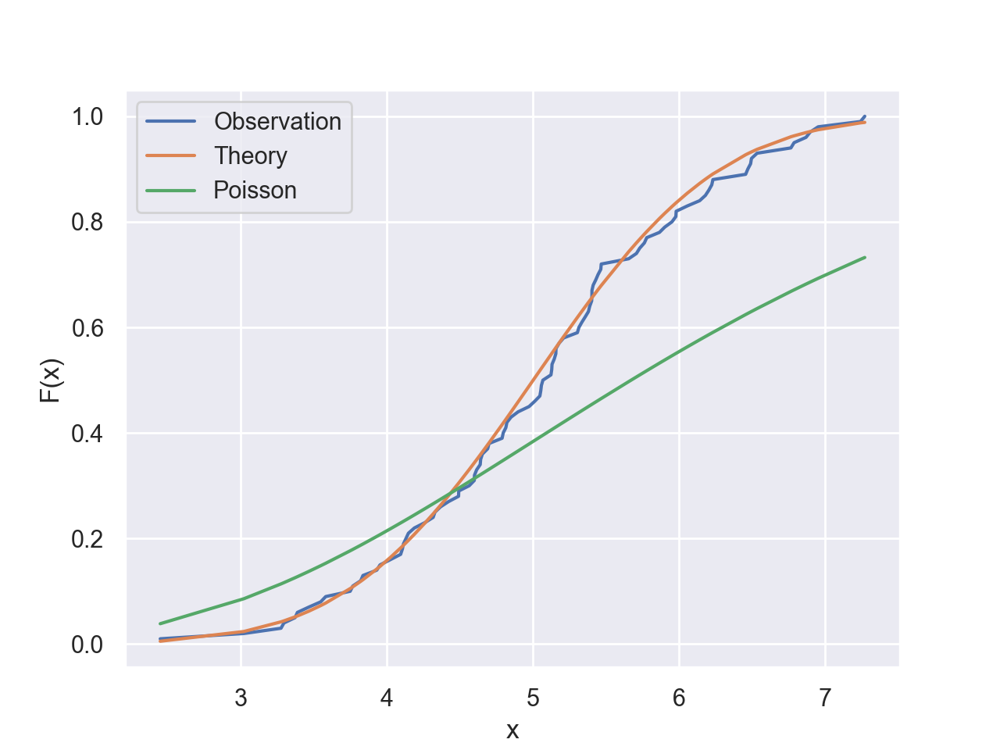

Difference relative to normal distribution
[0.00465987 0.00380705 0.01214829 0.00397889 0.00152979 0.00672521
 0.00776069 0.00707752 0.01219877 0.0051401  0.00155233 0.00112556
 0.00802083 0.00214034 0.00280804 0.0042158  0.01212452 0.00526887
 0.00267199 0.00806754 0.01347403 0.0119329  0.00100632 0.00673188
 0.00064531 0.00293532 0.01134531 0.02474376 0.01514758 0.03066621
 0.03340903 0.02392263 0.01925714 0.01839912 0.00959066 0.00395308
 0.00769031 0.00121064 0.02576477 0.01872424 0.01575824 0.00860579
 0.00984697 0.01889464 0.03875841 0.04418883 0.04824864 0.0407139
 0.03239495 0.02651698 0.0384218  0.03049501 0.02131441 0.01726697
 0.01156862 0.00212102 0.00041316 0.00249287 0.02885382 0.02288539
 0.02068734 0.0192169  0.01734507 0.0105858  0.00547963 0.00384593
 0.01371631 0.02068348 0.02420476 0.02857073 0.03176023 0.04072857
 0.01332122 0.02008412 0.01702687 0.01668273 0.01156524 0.02632584
 0.02615971 0.02896634 0.02562606 0.01614527 0.02416192 0.03273196
 0.03075702 0.025391

In [47]:
import numpy as np
import scipy.stats as st
import matplotlib.pyplot as plt
from numpy.random import seed
mu = 5
sigma = 1
seed(0)
step=2
if(step==1):
    fig, ax = plt.subplots()
    arr_1_more = np.random.normal(mu, sigma, size=6000)
    arr_1_sorted = np.sort(arr_1_more)
    y_cdf = st.norm.cdf(arr_1_sorted, mu, sigma) # the normal cdf
    y_cdf = st.norm.cdf(arr_1_sorted, mu, sigma) # the normal cdf
    norm_data=st.norm.pdf(arr_1_sorted, mu, sigma)
    poisson_pmf = st.poisson.pmf(mu, arr_1_sorted)
    ax.plot(arr_1_sorted, norm_data, label="Normal")
    ax.plot(arr_1_sorted, poisson_pmf, label="Poisson")
    ax.set_xlabel("x", size=12)
    ax.set_ylabel("F(x)", size=12)
    legend = ax.legend(loc="upper left")
    plt.show()
#generate random aray
if(step>1):
    mysize=100
    arr_1_few = np.random.normal(mu, sigma, size=mysize)
    #sort generated array
    arr_1_sorted = np.sort(arr_1_few)
    #edf
    arr_1_edf_few = np.arange(1, len(arr_1_few)+1) / len(arr_1_few)
    #generate dataset that follow a Poisson distribution with mean=mu
    poisson_cdf = 1-st.poisson.cdf(mu, arr_1_sorted)
    fig, ax = plt.subplots()
    ax.plot(arr_1_sorted, arr_1_edf_few, label="Observation")
    y_cdf = st.norm.cdf(arr_1_sorted, mu, sigma) # the normal cdf
    norm_data=st.norm.pdf(arr_1_sorted, mu, sigma)
    ax.plot(arr_1_sorted, y_cdf, label="Theory")
    ax.plot(arr_1_sorted, poisson_cdf, label="Poisson")
    ax.set_xlabel("x", size=12)
    ax.set_ylabel("F(x)", size=12)
    legend = ax.legend(loc="upper left")
    plt.show()
    #calculate absolute difference
    arr_dif_abs = np.abs(y_cdf-arr_1_edf_few)
    print("Difference relative to normal distribution")
    print(arr_dif_abs)
    #get max difference
    dn_ks = max(arr_dif_abs)
    print("Maximum difference relative to normal distribution:{}".format(dn_ks))
    #calculate absolute difference for poisson distribution
    arr_dif_abs_poisson = np.abs(y_cdf-poisson_cdf)
    print("Difference relative to poisson distribution")
    print(arr_dif_abs_poisson)
    ps_ks = max(arr_dif_abs_poisson)
    print("Maximum difference relative to normal distribution:{}".format(dn_ks))
    print("Maximum difference relative to poisson distribution:{}".format(ps_ks))
    D_critial=1.36 * np.sqrt(2/mysize)
    print("Critical value at 95% confidence interval:{}".format(D_critial))

SPOJENE JAMKY PO SLOUCENINACH

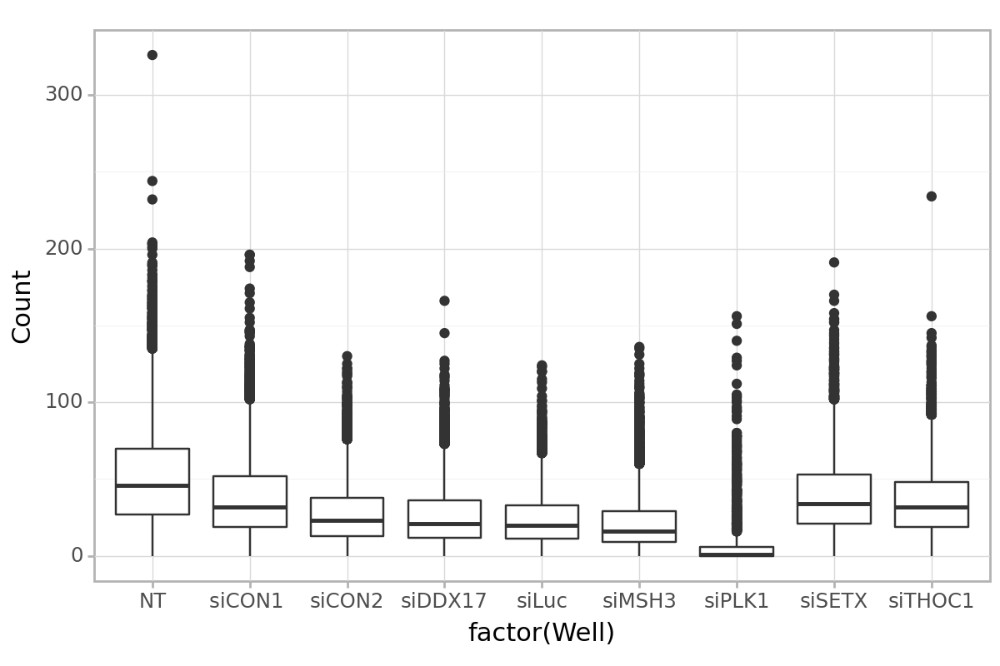

<Figure Size: (600 x 400)>

In [48]:
(
    ggplot(dose_0)
    + aes(x='Compound', y='Count')
    + geom_boxplot()
    + labs(x='factor(Well)', y='Count')
    + theme(figure_size=(6,4))
)

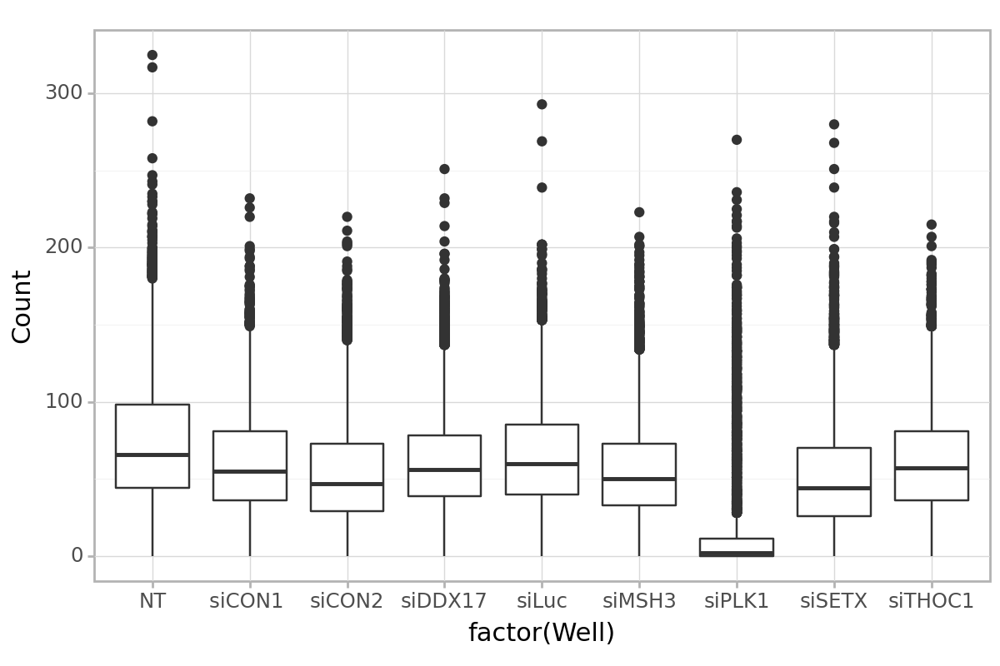

<Figure Size: (600 x 400)>

In [49]:
(
    ggplot(df.query('Dose==100'))
    + aes(x='Compound', y='Count')
    + geom_boxplot()
    + labs(x='factor(Well)', y='Count')
    + theme(figure_size=(6,4))
)